# Pr-Tmax cross-correlation

Assessment of model Pr-Tmax monthly anomalies cross-correlation over the 2000-2019 period.

(Bias corrected data for the period 2000-2019 was produced by training on data from the 1980-1999 period.)

In [1]:
import warnings
warnings.filterwarnings('ignore')

import sys
import numpy as np
import matplotlib.pyplot as plt
import cmocean
import cartopy.crs as ccrs
import seaborn as sns
from scipy import stats

sys.path.append('/g/data/xv83/users/at2708/bias_adjustment/evaluation/npcp/results')
import utils

In [2]:
def calc_pt_corr(da_p, da_t):
    """Calculate the monthly anomalies for Pr and Tasmax"""
        
    da_p_monthly = da_p.resample(time='1M').sum()
    climatology_p = da_p_monthly.groupby('time.month').mean('time') 
    anom_p = da_p_monthly - climatology_p
    anom_p_mean = anom_p.mean(dim='time')


    da_t_monthly = da_t.resample(time='1M').mean()
    climatology_t = da_t_monthly.groupby('time.month').mean('time') 
    anom_t = da_t_monthly - climatology_t
    anom_t_mean = anom_t.mean(dim='time')


    return anom_p_mean, anom_t_mean 

In [3]:
def get_data(rcm,nrm_region):
    """Get data needed for the evaluation"""

    assert rcm in ['BOM-BARPA-R', 'UQ-DES-CCAM-2105']
    assert nrm_region in ['EA','SA','NA']
    
    da_obs_p = utils.get_npcp_data(
        'pr',
        'observations',
        'AGCD',
        'raw',
        'task-reference',
        '2000-01-01',
        '2019-12-31',
        nrm_region
    )   
    da_obs_t = utils.get_npcp_data(
        'tasmax',
        'observations',
        'AGCD',
        'raw',
        'task-reference',
        '2000-01-01',
        '2019-12-31',
        nrm_region
    )  
    da_gcm_p = utils.get_npcp_data(
        'pr',
        'CSIRO-ACCESS-ESM1-5',
        'GCM',
        'raw',
        'task-reference',
        '2000-01-01',
        '2019-12-31',
        nrm_region
    )
    da_gcm_t = utils.get_npcp_data(
        'tasmax',
        'CSIRO-ACCESS-ESM1-5',
        'GCM',
        'raw',
        'task-reference',
        '2000-01-01',
        '2019-12-31',
        nrm_region
    )
    da_rcm_raw_p = utils.get_npcp_data(
        'pr',
        'CSIRO-ACCESS-ESM1-5',
        rcm,
        'raw',
        'task-reference',
        '2000-01-01',
        '2019-12-31',
        nrm_region
    )
    da_rcm_raw_t = utils.get_npcp_data(
        'tasmax',
        'CSIRO-ACCESS-ESM1-5',
        rcm,
        'raw',
        'task-reference',
        '2000-01-01',
        '2019-12-31',
        nrm_region
    )
    da_rcm_ecdfm_p = utils.get_npcp_data(
        'pr',
        'CSIRO-ACCESS-ESM1-5',
        rcm,
        'ecdfm',
        'task-historical',
        '2000-01-01',
        '2019-12-31',
        nrm_region
    )
    da_rcm_ecdfm_t = utils.get_npcp_data(
        'tasmax',
        'CSIRO-ACCESS-ESM1-5',
        rcm,
        'ecdfm',
        'task-historical',
        '2000-01-01',
        '2019-12-31',
        nrm_region
    )
    # TODO: Add additional bias correction methods as data becomes available 

    return da_obs_p, da_obs_t, da_gcm_p, da_gcm_t, da_rcm_raw_p, da_rcm_raw_t, da_rcm_ecdfm_p, da_rcm_ecdfm_t

In [4]:
def plot_mean_bias(ax, da_p, da_t, model_name, month, nrm_region):
    """Plot the mean bias for a particular model"""
    
    anom_p_mean, anom_t_mean = calc_pt_corr(da_p, da_t)
       
    def corrfunc(ax, x, y, **kws):
        finite_mask = np.isfinite(x) & np.isfinite(y)
        x_finite = x[finite_mask]
        y_finite = y[finite_mask]
        r, _ = stats.pearsonr(x_finite, y_finite)
        ax.annotate("r = {:.2f}".format(r),
                    xy=(.05, .05), xycoords=ax.transAxes, fontsize=14)
    if month == 'jan':
        x_data = anom_t_mean.sel(month=1).values.flatten()
        y_data  =anom_p_mean.sel(month=1).values.flatten()
    elif month == 'feb':
        x_data = anom_t_mean.sel(month=2).values.flatten()
        y_data  =anom_p_mean.sel(month=2).values.flatten()
    elif month == 'mar':
        x_data = anom_t_mean.sel(month=3).values.flatten()
        y_data  =anom_p_mean.sel(month=3).values.flatten()
    elif month == 'apr':
        x_data = anom_t_mean.sel(month=4).values.flatten()
        y_data  =anom_p_mean.sel(month=4).values.flatten()
    elif month == 'may':
        x_data = anom_t_mean.sel(month=5).values.flatten()
        y_data  =anom_p_mean.sel(month=5).values.flatten()
    elif month == 'jun':
        x_data = anom_t_mean.sel(month=6).values.flatten()
        y_data  =anom_p_mean.sel(month=6).values.flatten()
    elif month == 'jul':
        x_data = anom_t_mean.sel(month=7).values.flatten()
        y_data  =anom_p_mean.sel(month=7).values.flatten()
    elif month == 'aug':
        x_data = anom_t_mean.sel(month=8).values.flatten()
        y_data  =anom_p_mean.sel(month=8).values.flatten()
    elif month == 'sep':
        x_data = anom_t_mean.sel(month=9).values.flatten()
        y_data  =anom_p_mean.sel(month=9).values.flatten()
    elif month == 'oct':
        x_data = anom_t_mean.sel(month=10).values.flatten()
        y_data  =anom_p_mean.sel(month=10).values.flatten()
    elif month == 'nov':
        x_data = anom_t_mean.sel(month=11).values.flatten()
        y_data  =anom_p_mean.sel(month=11).values.flatten()
    elif month == 'dec':
        x_data = anom_t_mean.sel(month=12).values.flatten()
        y_data  =anom_p_mean.sel(month=12).values.flatten()
    else:
        print('Invalid month')
        return


    x_data_ = x_data[~np.isnan(x_data) & ~np.isnan(y_data) & np.isfinite(x_data) & np.isfinite(y_data)]
    y_data_ = y_data[~np.isnan(y_data) & ~np.isnan(x_data) & np.isfinite(x_data) & np.isfinite(y_data)]
    sns.scatterplot(ax=ax, x = x_data_, y = y_data_,alpha=0.5)
    sns.kdeplot(ax=ax, x = x_data_, y = y_data_)
    corrfunc(ax, x = x_data_, y = y_data_)
    
    ax.set_title(model_name+' NRM:'+nrm_region)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.set_xlabel('Tasmax anomalies ($^\circ$C/month)', fontsize=12)
    ax.set_ylabel('Pr anomalies (mm/month)', fontsize=12)
    ax.axhline(y=0, color='gray', linestyle='--', linewidth=0.5)
    ax.axvline(x=0, color='gray', linestyle='--', linewidth=0.5)

In [5]:
def plot_comparison(rcm,nrm_region):
    """Plot the complete comparison"""

    da_obs_p, da_obs_t, da_gcm_p, da_gcm_t, da_rcm_raw_p, da_rcm_raw_t, da_rcm_ecdfm_p, da_rcm_ecdfm_t = get_data(rcm,nrm_region)

    months= ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
        
    rows, cols = len(months), 4  
    
    fig, axs = plt.subplots(rows, cols, figsize=[24, 6*rows])
    
    for row, month in enumerate(months):

        ax1 = axs[row, 0]
        ax2 = axs[row, 1]
        ax3 = axs[row, 2]
        ax4 = axs[row, 3]

         # Plot AGCD
        plot_mean_bias(ax1, da_obs_p, da_obs_t, 'AGCD', month, nrm_region)
        ax1.set_title(f'AGCD NRM:{nrm_region} ({month.upper()})', fontsize=14)
        
        # Plot GCM 
        plot_mean_bias(ax2, da_gcm_p, da_gcm_t, 'CSIRO-ACCESS-ESM1-5', month, nrm_region)
        ax2.set_title(f'CSIRO-ACCESS-ESM1-5 NRM:{nrm_region} ({month.upper()})', fontsize=14)

        # Plot RCM raw 
        plot_mean_bias(ax3, da_rcm_raw_p, da_rcm_raw_t, f'{rcm} (raw)', month, nrm_region)
        ax3.set_title(f'{rcm} (raw) NRM:{nrm_region} ({month.upper()})', fontsize=14)

        # Plot RCM bias corrected 
        plot_mean_bias(ax4, da_rcm_ecdfm_p, da_rcm_ecdfm_t,  f'{rcm} (ecdfm)', month, nrm_region)
        ax4.set_title(f'{rcm} (ecdfm) NRM:{nrm_region} ({month.upper()})', fontsize=14)
    
    plt.suptitle(f' P-Tmax cross-correlation of monthly anomalies for different months and NRM regions in the 2000-2019', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

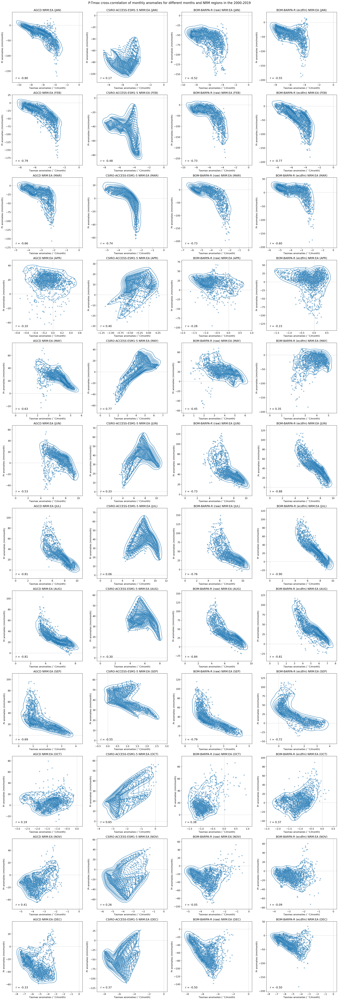

In [6]:
plot_comparison('BOM-BARPA-R','EA')

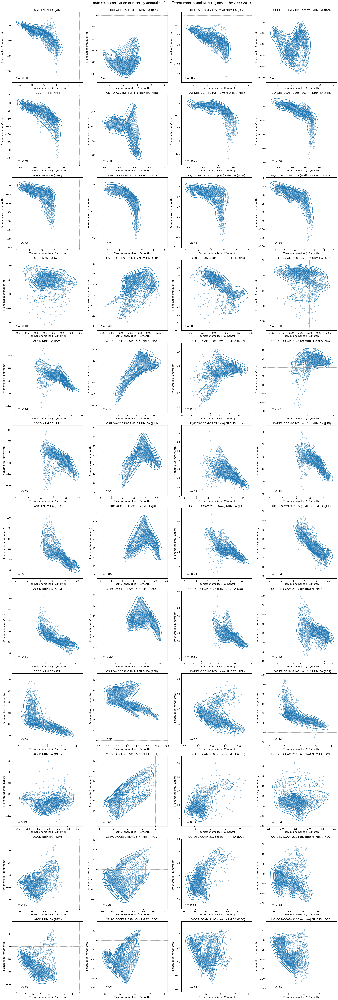

In [7]:
plot_comparison('UQ-DES-CCAM-2105','EA')